In [1]:
import json
from dockstring import load_target
import matplotlib.pyplot as plt
import ipywidgets as widget
import rdkit.Chem as Chem
from rdkit.Chem import RDConfig
from rdkit.Chem import rdFingerprintGenerator
from rdkit import DataStructs
import numpy as np
import os
import sys
sys.path.append(os.path.join(RDConfig.RDContribDir, 'SA_Score'))
# now you can import sascore!
import sascorer
from tqdm import tqdm
import seaborn as sns

In [2]:
with open('sampling_temp_3.json', 'r') as m:
    out = json.load(m)

In [3]:
out

{'ABL1': ['C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C( enjoyed)l)NC(=O)C found/C(=NO)/C3=CC= first@H](O3)C(=O)N[C@@H](CCC(=O)ON4C(=O)CCF4+O)C(=O)O)NC(=O)N',
  'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O',
  '(CCCN chosenC=O)C1=NC=CC(=C1)C(=O)N[C@@H](CC2=CN=CN2)C(=O)O)NC(=O)[C@HCCCN=CNC(=O)[C@@H]',
  'C1=CC=C2C(=C1)C( organizationsO2)SC[C@@H](C(@IHC setting3CCC(=O)NC3)N)[C@@H](C(=O)NCC(=O)O)N',
  'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=O6CCC[C@H](C ourC@ last6CCC[C@@H](C(=O)NO)N7C5=C4 see=CC(=C5)NC(=O)[C@H](CC6=CN=CN6)N)N)O)NC(=O)[C@H](CC(=O)N)N',
  'C[C@@H)C(=O)N[C@@H](CCP(=O-)(N[C@@H](CON)C(=O)N[C@H](CC One= behalfNC2=CC=CC=C 27)C(=O)O onO page theirN',
  'CN1C=NC2=C(C1=O) target=CC3=C(C2H]4[C@@H]e([C@H]([C@@H]([C@H](O4)CO)O) were fromOC(=O])C6 any(C(=O)C7=C gamesC(=O)N strongC6=C7NC8=C(CN23)C=CC(=C8)S(=O)(=O)O)N(C)C',
  'C1= that)N= different=NC(@ anyC1=O)N ItC lines(=O)N test(=O)NCC( teams(=O)(=O)O)C(=O)NCC(=O)N[C@@H](CP(=O)(O=O)O1)C(=O)

In [4]:
smiles_len = {}
for k in out.keys():
    tmp = []
    for i in out[k]:
        tmp.append(len(i))
    smiles_len[k] = tmp

In [5]:
def plot_len(protein):
    plt.plot(smiles_len[protein])

In [6]:
def plot_len_hist(protein):
    plt.hist(smiles_len[protein], bins=50)
    plt.show()

In [7]:
def get_qed(smiles_dict):
    qed_dict = {}
    for k in smiles_dict.keys():
        tmp = []
        for i in smiles_dict[k]:
            try:
                m = Chem.MolFromSmiles(i)
                tmp.append(Chem.QED.qed(m))
            except ValueError:
                tmp.append(0)
        qed_dict[k] = tmp
    return qed_dict

In [8]:
def plot_qed(protein):
    plt.plot(qed_out[protein])
    plt.title(f"{protein} QED")
    plt.ylabel('QED')
    plt.xlabel('Generated mol')
    plt.show()

In [9]:
qed_out = get_qed(out)

[15:10:13] SMILES Parse Error: syntax error while parsing: C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:13] SMILES Parse Error: check for mistakes around position 33:
[15:10:13] 1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:13] ~~~~~~~~~~~~~~~~~~~~^
[15:10:13] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(' for input: 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C('
[15:10:13] SMILES Parse Error: extra close parentheses while parsing: C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O
[15:10:13] SMILES Parse Error: check for mistakes around position 32:
[15:10:13] C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N
[15:10:13] ~~~~~~~~~~~~~~~~~~~~^
[15:10:13] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O' for input: 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O'
[15:10:13] SMILES 

In [10]:
def get_mw(smiles_dict):
    mw_dict = {}
    for k in smiles_dict.keys():
        tmp = []
        for i in smiles_dict[k]:
            try:
                m = Chem.MolFromSmiles(i)
                if m is not None:
                    tmp.append(Chem.Descriptors.MolWt(m))
                else:
                    tmp.append(0)
            except ValueError:
                tmp.append(0)
        mw_dict[k] = tmp
    return mw_dict

In [11]:
def plot_mw(protein):
    plt.plot(mw_out[protein])
    plt.title(f"{protein} MW")
    plt.ylabel('MW')
    plt.xlabel('Generated mol')
    plt.show()

In [12]:
mw_out = get_mw(out)

[15:10:14] SMILES Parse Error: syntax error while parsing: C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:14] SMILES Parse Error: check for mistakes around position 33:
[15:10:14] 1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:14] ~~~~~~~~~~~~~~~~~~~~^
[15:10:14] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(' for input: 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C('
[15:10:14] SMILES Parse Error: extra close parentheses while parsing: C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O
[15:10:14] SMILES Parse Error: check for mistakes around position 32:
[15:10:14] C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N
[15:10:14] ~~~~~~~~~~~~~~~~~~~~^
[15:10:14] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O' for input: 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O'
[15:10:14] SMILES 

In [13]:
def get_logp(smiles_dict):
    logp_dict = {}
    for k in smiles_dict.keys():
        tmp = []
        for i in smiles_dict[k]:
            try:
                m = Chem.MolFromSmiles(i)
                if m is not None:
                    tmp.append(Chem.Crippen.MolLogP(m))
                else:
                    tmp.append(0)
            except ValueError:
                tmp.append(0)
        logp_dict[k] = tmp
    return logp_dict

In [14]:
def plot_logp(protein):
    plt.plot(logp_out[protein])
    plt.title(f"{protein} logP")
    plt.ylabel('logP')
    plt.xlabel('Generated mol')
    plt.show()

In [15]:
logp_out = get_logp(out)

[15:10:15] SMILES Parse Error: syntax error while parsing: C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:15] SMILES Parse Error: check for mistakes around position 33:
[15:10:15] 1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:15] ~~~~~~~~~~~~~~~~~~~~^
[15:10:15] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(' for input: 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C('
[15:10:15] SMILES Parse Error: extra close parentheses while parsing: C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O
[15:10:15] SMILES Parse Error: check for mistakes around position 32:
[15:10:15] C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N
[15:10:15] ~~~~~~~~~~~~~~~~~~~~^
[15:10:15] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O' for input: 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O'
[15:10:15] SMILES 

In [16]:
def get_sa(smiles_dict):
    sa_dict = {}
    for k in smiles_dict.keys():
        tmp = []
        for i in smiles_dict[k]:
            try:
                m = Chem.MolFromSmiles(i)
                if m is not None:
                    sac = sascorer.calculateScore(m)
                    if sac is not None:
                        tmp.append(sac)
                    else:
                        tmp.append(0)
                else:
                    tmp.append(0)
            except ValueError:
                tmp.append(0)
        sa_dict[k] = tmp
    return sa_dict

In [17]:
def plot_sa(protein):
    plt.plot(sa_out[protein])
    plt.title(f"{protein} SA Score")
    plt.ylabel('SA Score')
    plt.xlabel('Generated mol')
    plt.show()

In [18]:
sa_out = get_sa(out)

[15:10:16] SMILES Parse Error: syntax error while parsing: C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:16] SMILES Parse Error: check for mistakes around position 33:
[15:10:16] 1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:16] ~~~~~~~~~~~~~~~~~~~~^
[15:10:16] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(' for input: 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C('
[15:10:16] SMILES Parse Error: extra close parentheses while parsing: C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O
[15:10:16] SMILES Parse Error: check for mistakes around position 32:
[15:10:16] C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N
[15:10:16] ~~~~~~~~~~~~~~~~~~~~^
[15:10:16] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O' for input: 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O'
[15:10:16] SMILES 

### logP

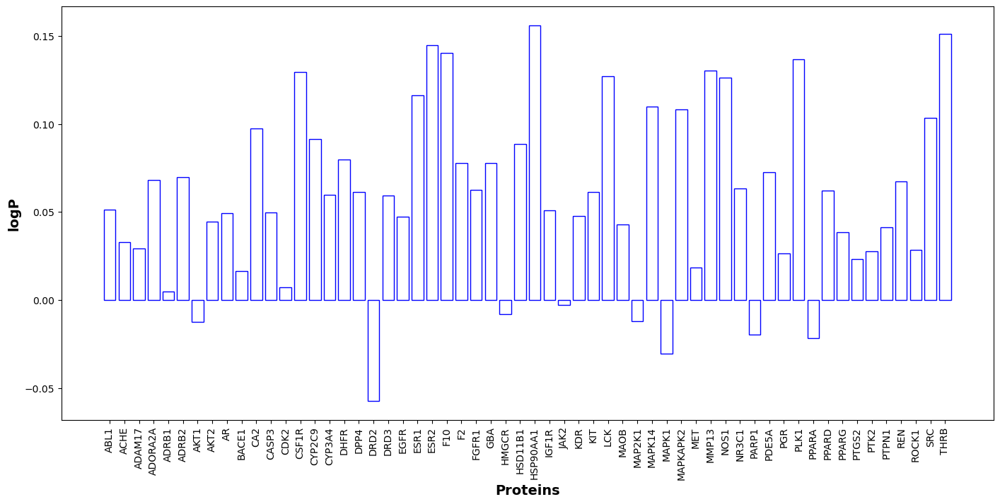

In [19]:
avg_logp = {}
for k in logp_out.keys():
    avg_logp[k] = np.mean(logp_out[k])

plt.figure(figsize=(14,7))
plt.bar(list(avg_logp.keys()), avg_logp.values(), fill=False, edgecolor='blue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.xlabel('Proteins', fontsize=14, fontweight='bold')
plt.ylabel('logP', fontsize=14, fontweight='bold')
plt.show()
# plt.xlabel(avg_qed.keys())

In [20]:
widget.interact(plot_logp,protein=logp_out.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_logp(protein)>

### SA Score

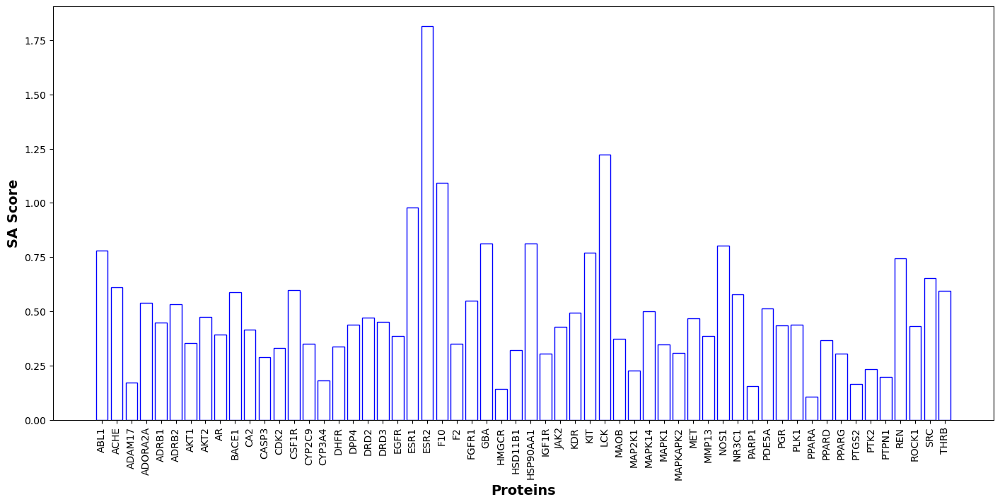

In [21]:
avg_sa = {}
for k in sa_out.keys():
    avg_sa[k] = np.mean(sa_out[k])

plt.figure(figsize=(14,7))
plt.bar(list(avg_sa.keys()), avg_sa.values(), fill=False, edgecolor='blue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.xlabel('Proteins', fontsize=14, fontweight='bold')
plt.ylabel('SA Score', fontsize=14, fontweight='bold')
plt.show()
# plt.xlabel(avg_qed.keys())

In [22]:
widget.interact(plot_sa,protein=sa_out.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_sa(protein)>

### QED

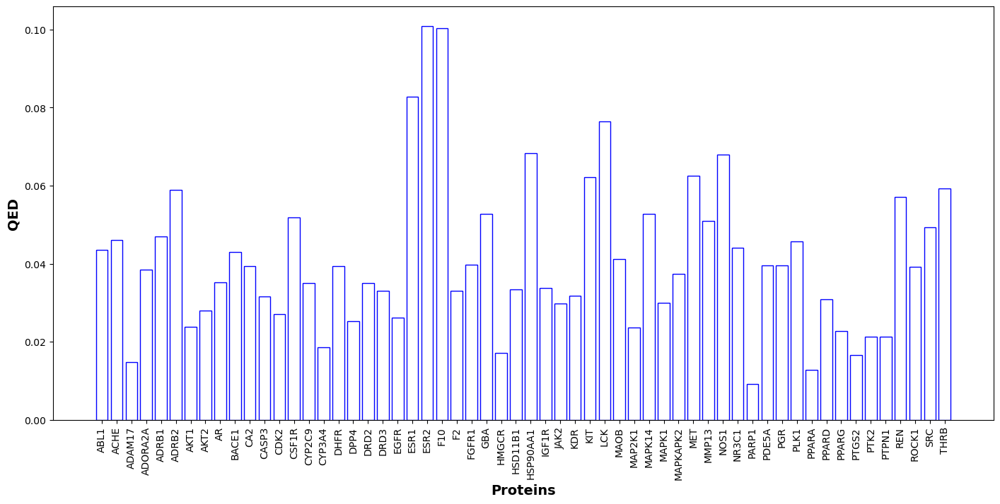

In [23]:
avg_qed = {}
for k in qed_out.keys():
    avg_qed[k] = np.mean(qed_out[k])

plt.figure(figsize=(14,7))
plt.bar(list(avg_qed.keys()), avg_qed.values(), fill=False, edgecolor='blue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.xlabel('Proteins', fontsize=14, fontweight='bold')
plt.ylabel('QED', fontsize=14, fontweight='bold')
plt.show()
# plt.xlabel(avg_qed.keys())

In [24]:
widget.interact(plot_qed,protein=qed_out.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_qed(protein)>

### MW

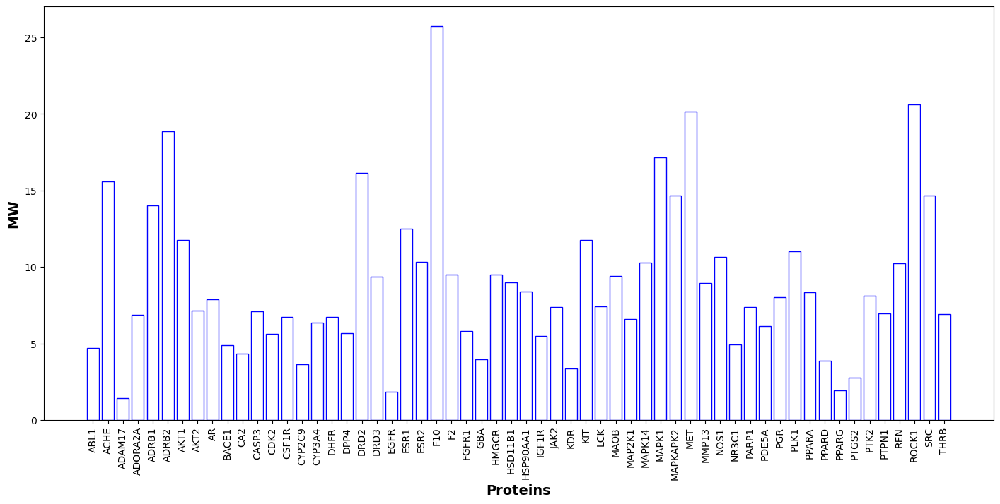

In [25]:
avg_mw = {}
for k in mw_out.keys():
    avg_mw[k] = np.mean(mw_out[k])

plt.figure(figsize=(14,7))
plt.bar(list(avg_mw.keys()), avg_mw.values(), fill=False, edgecolor='blue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.xlabel('Proteins', fontsize=14, fontweight='bold')
plt.ylabel('MW', fontsize=14, fontweight='bold')
plt.show()
# plt.xlabel(avg_qed.keys())

In [26]:
widget.interact(plot_mw,protein=mw_out.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_mw(protein)>

### SMILES Length

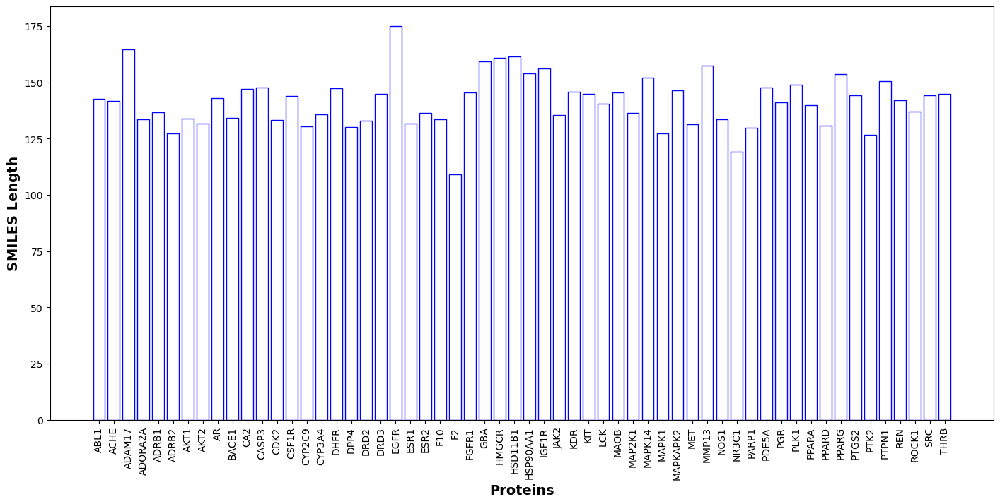

In [27]:
avg_len = {}
for k in smiles_len.keys():
    avg_len[k] = np.mean(smiles_len[k])

plt.figure(figsize=(14,7))
plt.bar(list(avg_len.keys()), avg_len.values(), fill=False, edgecolor='blue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.xlabel('Proteins', fontsize=14, fontweight='bold')
plt.ylabel('SMILES Length', fontsize=14, fontweight='bold')
plt.show()
# plt.xlabel(avg_qed.keys())

In [28]:
widget.interact(plot_len,protein=smiles_len.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_len(protein)>

In [29]:
widget.interact(plot_len_hist,protein=smiles_len.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_len_hist(protein)>

### VUN

In [30]:
def validity_calculator(smiles_dict):
    validity_dict = {}
    for k in smiles_dict.keys():
        tmp = []
        for i in smiles_dict[k]:
            try:
                m = Chem.MolFromSmiles(i)
                if m is not None:
                    t = Chem.MolToSmiles(m)
                    tmp.append(t)
                else:
                    pass
            except ValueError:
                pass
        v = len(tmp)/len(smiles_dict[k])
        validity_dict[k] = (tmp, v)
    return validity_dict

In [31]:
valid_dict = validity_calculator(out)

[15:10:23] SMILES Parse Error: syntax error while parsing: C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:23] SMILES Parse Error: check for mistakes around position 33:
[15:10:23] 1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:23] ~~~~~~~~~~~~~~~~~~~~^
[15:10:23] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(' for input: 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C('
[15:10:23] SMILES Parse Error: extra close parentheses while parsing: C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O
[15:10:23] SMILES Parse Error: check for mistakes around position 32:
[15:10:23] C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N
[15:10:23] ~~~~~~~~~~~~~~~~~~~~^
[15:10:23] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O' for input: 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O'
[15:10:23] SMILES 

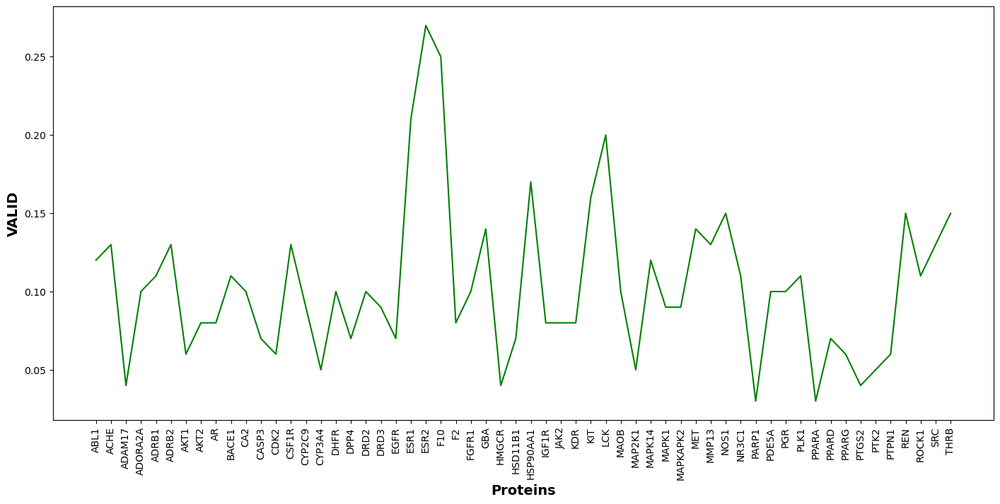

In [32]:
valid = {}
for k in valid_dict.keys():
    valid[k] = valid_dict[k][1]

plt.figure(figsize=(14,7))
# plt.bar(list(valid.keys()), valid.values(), fill=False, edgecolor='blue')
plt.plot(list(valid.keys()), valid.values(), color='green')
plt.xticks(rotation=90)
plt.tight_layout()
plt.xlabel('Proteins', fontsize=14, fontweight='bold')
plt.ylabel('VALID', fontsize=14, fontweight='bold')
plt.show()
# plt.xlabel(avg_qed.keys())

### Internal diversity

In [33]:
def pairwise_similarity(fingerprints_list):
    

    similarities = np.zeros((len(fingerprints_list), len(fingerprints_list)))

    for i in range(len(fingerprints_list)):
        for j in range(i, len(fingerprints_list)):  # Start from i to avoid redundant calculations
            similarity = DataStructs.TanimotoSimilarity(fingerprints_list[i], fingerprints_list[j])
            similarities[i, j] = similarity
            similarities[j, i] = similarity

    return similarities

In [34]:
def get_similarity(out_dict):
    similarity_dict = {}
    fgrps_dict = {}
    for k in out_dict.keys():
        fgrps = []
        for i in out_dict[k]:
            try:
                m = Chem.MolFromSmiles(i)
                if m is not None:
                    rdkit_gen = rdFingerprintGenerator.GetRDKitFPGenerator(maxPath=7)
                    fp = rdkit_gen.GetFingerprint(m)
                    fgrps.append(fp)
                else:
                    pass
            except ValueError:
                pass
                
        fgrps_dict[k] =   fgrps

    for k in fgrps_dict.keys():
        sim = pairwise_similarity(fgrps_dict[k])
        similarity_dict[k] = sim
    
    return similarity_dict

In [35]:
sim_out = get_similarity(out)

[15:10:27] SMILES Parse Error: syntax error while parsing: C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:27] SMILES Parse Error: check for mistakes around position 33:
[15:10:27] 1)C(=CN2)C[C@@H](C(=@H](C(
[15:10:27] ~~~~~~~~~~~~~~~~~~~~^
[15:10:27] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C(' for input: 'C1=CC=C2C(=C1)C(=CN2)C[C@@H](C(=@H](C('
[15:10:27] SMILES Parse Error: extra close parentheses while parsing: C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O
[15:10:27] SMILES Parse Error: check for mistakes around position 32:
[15:10:27] C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N
[15:10:27] ~~~~~~~~~~~~~~~~~~~~^
[15:10:27] SMILES Parse Error: Failed parsing SMILES 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O' for input: 'C1=CC=C2C(=C1)C(=CN2)C(C(=O)N)N)C(=O)N[C@@H](CCC(O)N)C(=O)N[C@@H](CCC(NH2+]NH3+])C(=O)ON3C(=O)CCC3=O'
[15:10:27] SMILES 

In [36]:
def plot_sim(protein):
    plt.figure(figsize=(12, 8))
    sns.heatmap(sim_out[protein], cmap='Reds', annot=False, fmt='.2f', cbar_kws={'label': 'Tanimoto Similarity'})
    plt.title(f"{protein} Tanimoto similarity (Sampling temperature=0.5)", fontweight='bold')
    plt.ylabel('Fingerprint Index')
    plt.xlabel('Fingerprint Index')
    plt.xticks(rotation=90, ha="right")
    plt.show()

In [37]:
widget.interact(plot_sim,protein=sim_out.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_sim(protein)>

## Log likelihood 

In [38]:
with open('loglikelihood_temp_3.json', 'r') as m:
    log_file = json.load(m)

In [39]:
log_l = {}
for k in log_file.keys():
    tmp = []
    for i in log_file[k]:
        if i != -float('inf'):
            tmp.append(float(i))
    log_l[k] = tmp

In [40]:
log_l['ABL1']

[-79.5845,
 -67.078575,
 -58.445724,
 -69.97399,
 -101.0931,
 -80.52045,
 -132.26553,
 -114.52312,
 -73.02281,
 -81.36943,
 -232.41165,
 -64.70084,
 -43.21122,
 -41.152035,
 -77.16992,
 -50.53967,
 -66.92919,
 -96.31507,
 -55.90865,
 -27.980534,
 -55.57904,
 -89.06283,
 -53.39721,
 -211.28954,
 -105.76273,
 -140.61171,
 -45.533176,
 -103.44182,
 -90.5312,
 -78.91049,
 -200.40834,
 -73.17356,
 -108.59564,
 -85.73117,
 -86.48952,
 -71.771736,
 -230.22246,
 -61.203915,
 -40.635063,
 -76.867256,
 -74.32755,
 -162.06006,
 -202.59184,
 -97.99821,
 -39.60858,
 -110.9413,
 -41.721943,
 -125.18711,
 -81.83405,
 -31.444218,
 -69.1426,
 -65.11996,
 -59.79237,
 -113.16594,
 -35.958733,
 -41.875713,
 -52.93554,
 -217.30264,
 -107.569046,
 -55.054153,
 -58.311447,
 -80.84493,
 -82.092575,
 -106.597015,
 -106.42311,
 -157.90839,
 -264.23474,
 -49.605858,
 -119.937584,
 -69.62931,
 -42.090336,
 -38.23865,
 -102.05468,
 -61.27369,
 -131.24567,
 -116.10865,
 -74.36106,
 -73.82985,
 -335.83862,
 -166.167

In [41]:
def plot_log(protein):
    plt.figure(figsize=(12, 8))
    plt.plot(log_l[protein])
    plt.title(f"{protein} Log likelihood", fontweight='bold')
    plt.ylabel('Log likelihood')
    plt.xlabel('Molecule generated')
    plt.xticks(rotation=90, ha="right")
    plt.show()

In [42]:
widget.interact(plot_log,protein=log_l.keys())

interactive(children=(Dropdown(description='protein', options=('ABL1', 'ACHE', 'ADAM17', 'ADORA2A', 'ADRB1', '…

<function __main__.plot_log(protein)>

In [43]:
mean_log = {}

for k in log_l.keys():
    m = np.mean(log_l[k])
    mean_log[k] = m

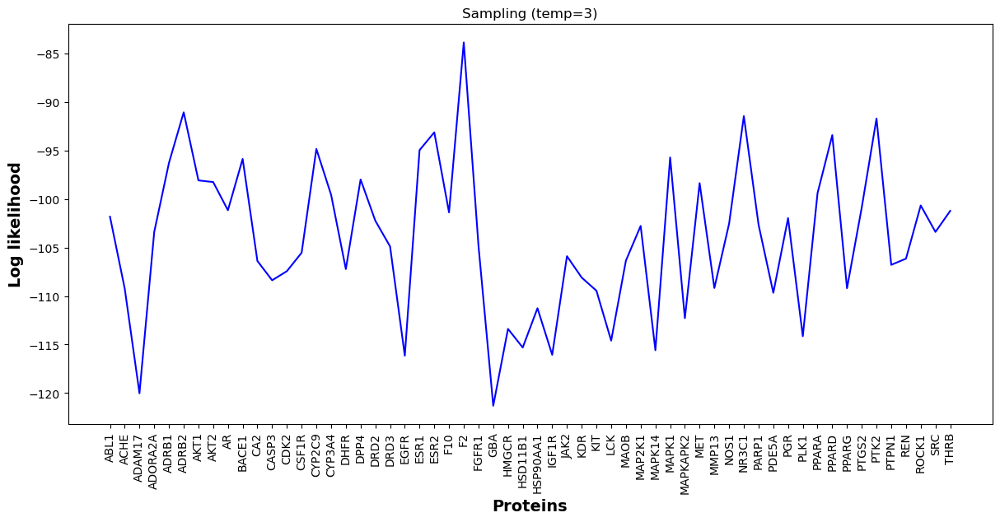

In [45]:
plt.figure(figsize=(12,6))
plt.plot(list(mean_log.keys()), mean_log.values(), color='blue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.xlabel('Proteins', fontsize=14, fontweight='bold')
plt.title('Sampling (temp=3)')
plt.ylabel('Log likelihood', fontsize=14, fontweight='bold')
plt.show()

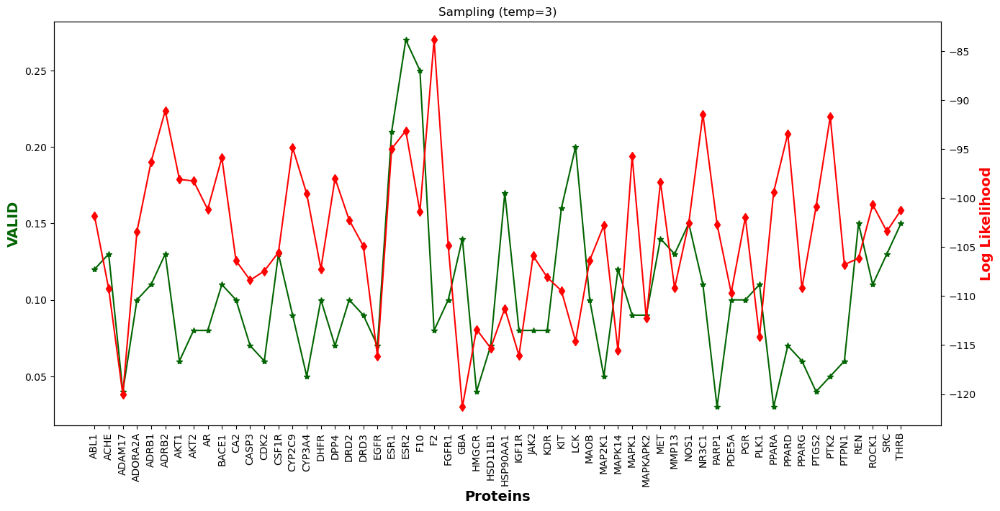

In [46]:
fig, ax1 = plt.subplots(figsize=(14,7))

ax1.plot(list(valid.keys()), valid.values(), color='darkgreen', marker='*')
ax1.set_xlabel('Proteins', fontsize=14, fontweight='bold')
ax1.set_ylabel('VALID', fontsize=14, fontweight='bold', color='darkgreen')
ax1.tick_params(axis='x', rotation=90)

# Create the second y-axis for the second dataset (valid2)
ax2 = ax1.twinx()  # This creates a second y-axis sharing the same x-axis
ax2.plot(list(mean_log.keys()), mean_log.values(), color='red', marker='d')
ax2.set_ylabel('Log Likelihood', fontsize=14, fontweight='bold', color='red')
plt.tight_layout()
# Show the plot
plt.title('Sampling (temp=3)')
plt.show()
